# Esame _TRMD_
L'obiettivo del seguente codice è quello di studiare gli aloni di materia oscura usando le informazioni e i dati forniti dalla [consegna](https://github.com/MatteoViat/Esame_TRMD/blob/main/Esercizio%20Fit%20NFW%20density%20profile.pdf).

## Fit analitico
Il profilo di densità proiettato degli aloni di materia oscura è adeguatamente descritto dal
fit analitico (_2D projected NFW profile_):  $$ \Sigma(R,M,c,z)=2 r_s \rho_s f(x) $$  
dove $M$ è la massa dell'alone di materia oscura e $c \! $ la concentrazione; $r_s$ è il raggio
caratteristico dell'ammasso, ed è pari a:  $$r_s=\frac{1}{c} \left((M \frac{3}{4 \pi 200 \rho_m(1+z)^3}\right)^\frac{1}{3}$$  
dove $\rho_m$ è la densità media dell'universo approssimata a $\rho_m \backsimeq 0.286 \cdot 0.7^2 \cdot 2.7751428946𝑒11 \ [\text{M}_\odot\text{/Mpc}^3]$.  
$\rho_s$ è la densità caratteristica dell'ammasso pari a:  
$$\rho_s=\rho_m(1+z)^3\delta_{char}$$
$$\delta_{\text{char}}=\frac{200c^3}{3f_c}$$
$$f_c=\ln(1+c)-\frac{c}{1+c}$$  
Infine $x=R/r_s$, con $R$ distanza dal centro dell'alone di materia oscura espressa in Mpc, e la funzione $f(x)$ è pari a:  
$$
f(x)  \left\{ \begin{array}{rcl}
\frac{1}{x^2-1}\left[1-\frac{2}{\sqrt{1-x^2}}\arctan{\sqrt{\frac{1-x}{1+x}}}\right] & \mbox{in} & x<1 \\ \frac{1}{3} & \mbox{if} & x=1 \\
\frac{1}{x^2-1}\left[1-\frac{2}{\sqrt{x^2-1}}\textrm{arctanh}{\sqrt{\frac{x-1}{1+x}}}\right] & \mbox{in} & x>1 
\end{array}\right.
$$

### Implementazione:

In [4]:
import numpy as np

In [5]:
# Definizione del profilo di densità proiettato NFW
def f(x):
    if x < 1:
        return 1 / (x**2 - 1) * (1 - np.arctanh(np.sqrt((1 - x) / (1 + x))) *2 / np.sqrt(1 - x**2))
    elif x == 1:
        return 1 / 3
    else:
        return 1 / (x**2 - 1) * (1 - np.arctan(np.sqrt((x - 1) / (1 + x))) *2 / np.sqrt(x**2 - 1))

def NFW_profile(R, M, c, z):
    rho_m = 0.286 * 0.7**2 * 2.7751428946e11  
    r_s = (M * 3 / (4 * np.pi * 200 * rho_m * (1 + z)**3))**(1/3) / c
    f_c = np.log(1 + c) - c / (1 + c)
    delta_char = 200 / 3 * c**3 / f_c 
    rho_s = rho_m * (1 + z)**3 * delta_char
    x = R / r_s
    return 2 * f(x) * r_s * rho_s

Si procede a mostrare mediante un grafico composto da 9 pannelli i profili di densità $ \Sigma(R,M,c,z)$ in scala logaritmica nell'intervallo $R \in [0.03,1.0]$ Mpc, per le seguenti combinazioni di valori di massa e concentrazione:
$$ M=[10^{13.5}, 10^{14.0}, 10^{15.0}]\text{M}_\odot \hspace{45pt} c=[2,5,10] \hspace{45pt} z=0.0$$

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

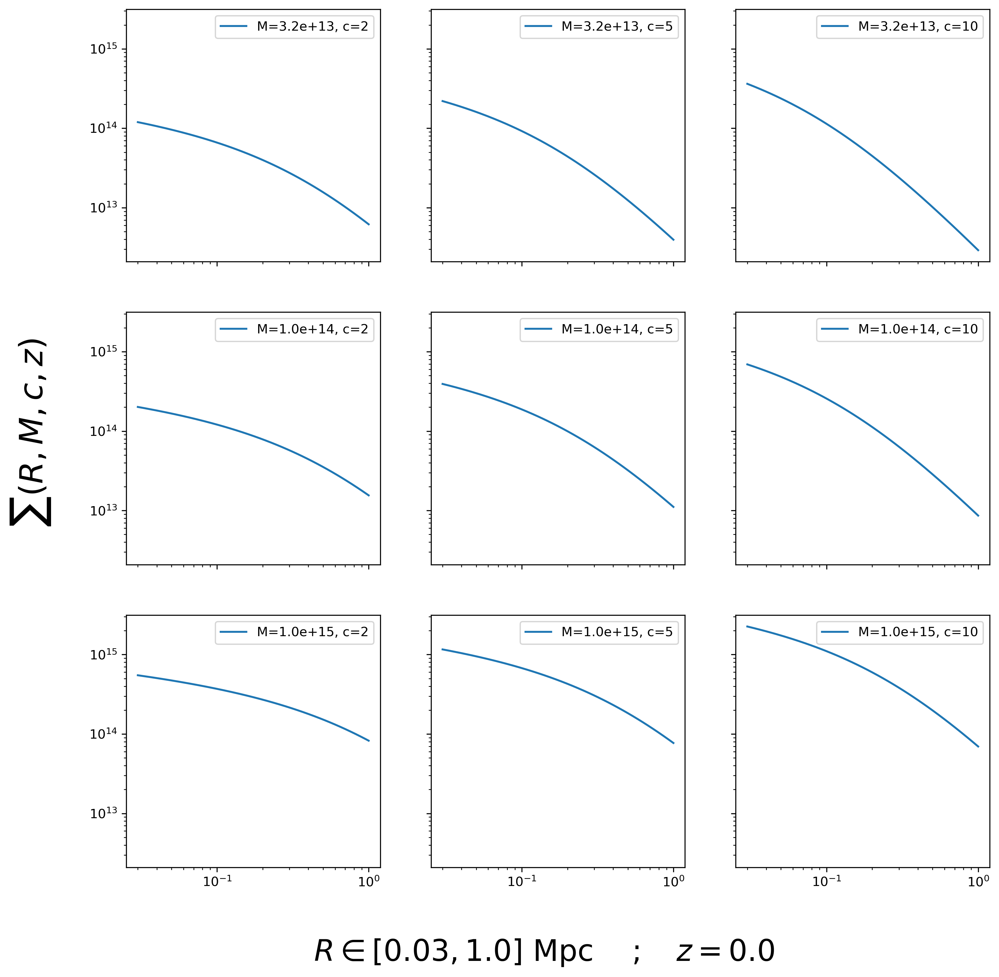

In [8]:
# Generazione dei grafici per diverse combinazioni di M e c
M_val = [10**13.5, 10**14.0, 10**15.0]
c_val = [2, 5, 10]
R_val = np.linspace(0.03, 1.0, 300)

fig, axes = plt.subplots(3, 3, figsize=(12, 12), sharex=True, sharey=True, dpi=300)
for i, M in enumerate(M_val):
    for j, c in enumerate(c_val):
        ax = axes[i, j]
        sigma_val = [NFW_profile(R, M, c, z=0.0) for R in R_val]
        ax.plot(R_val, sigma_val, label=f'M={M:.1e}, c={c}')
        ax.set_xscale('log'); ax.set_yscale('log')
        ax.legend()
        
# Aggiunta di etichette comuni
fig.supxlabel('$R \in [0.03,1.0]$ Mpc $\quad ; \quad z=0.0$', fontsize=23, y=.02)
fig.supylabel('$\sum (R,M,c,z)$', fontsize=25)

plt.show()

## Studio simulazione cosmologica N-body
Prendiamo in esame i risulatati di una simulazione cosmologica N-body ([halo-catalog.fit](https://drive.google.com/file/d/1-D4acsEVv5H0IoBtjPVPJHtaivR5glJW/view?usp=drive_link)) e i valori $R$ in [Mpc] a cui sono calcolati i profili di intensità ([R-values](https://drive.google.com/file/d/10w_2LiPmb9QtHsa-lFhXjM_sbFOPpBYS/view?usp=drive_link)).

In [10]:
from astropy.io import fits

In [11]:
# Carica i valori di R
R_values = np.load('R_values.npy')

# Carica il catalogo della simulazione cosmologica
halo_catalog = fits.open('halo_catalog.fit')[1].data
Z = halo_catalog['Z']
Lambda_TR = halo_catalog['LAMBDA_TR']   # ricchezza
Sigma_of_R = halo_catalog['SIGMA_of_R']

_**Lambda_TR**_ (indicata con $\lambda$) è la _ricchezza_, una somma pesata del numero di galassie che popolano l'alone e che funge da _proxy_ per la massa, ovvero viene utilizzata come stima indiretta della massa dell’alone (aloni più massicci tendono ad ospitare più galassie).

#### Intervalli di ricchezza
Si suddivide il catalogo in 5 intervalli di ricchezza aventi come estrmi $\lambda=[15, 20, 30, 45, 60, 200]$ e si calcola il redshift medio, il profilo di densità medio e la sua deviazione standard in funzione di $R$. Si riportano i risultati in un grafico con 5 pannelli:

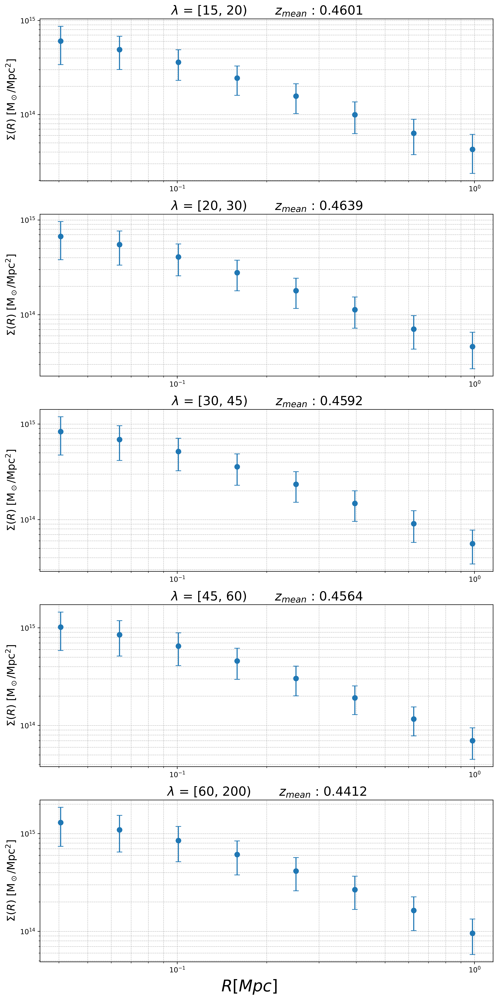

In [14]:
# Definizione degli intervalli di ricchezza
lambda_bins = [15, 20, 30, 45, 60, 200]

# Creazione di un grafico con 5 pannelli
fig, axes = plt.subplots(5, 1, figsize=(10, 20), dpi=400)

for i in range(5):
    # Seleziona i dati nel bin di ricchezza corrente
    mask = (Lambda_TR >= lambda_bins[i]) & (Lambda_TR < lambda_bins[i+1])   # maschera booleana
    
    # Calcola il redshift medio 
    mean_redshift = np.mean(Z[mask])
    
    # Calcola il profilo di densità medio e la deviazione standard
    mean_density_profile = np.mean(Sigma_of_R[mask], axis=0)  # media sulle colonne
    std_density_profile = np.std(Sigma_of_R[mask], axis=0)

    # Plot del profilo di densità medio con la deviazione standard
    axes[i].errorbar(R_values, mean_density_profile, yerr=std_density_profile, fmt='o', capsize=4, markersize=7, label=f'$\lambda$ = [{lambda_bins[i]}, {lambda_bins[i+1]})')
    axes[i].set_xscale('log'); axes[i].set_yscale('log')
    axes[i].set_ylabel('$\Sigma(R)$ [M$_\odot$/Mpc$^2$]', fontsize=15)
    axes[i].set_title(f'$\lambda$ = [{lambda_bins[i]}, {lambda_bins[i+1]})       $z_{{mean}}$ : {mean_redshift:.4f}', size=18)
    axes[i].grid(True, which='both', ls='--', linewidth=0.5)

# Aggiunta di etichette comuni
fig.supxlabel('$R [Mpc]$', fontsize=23, y=.01)
plt.tight_layout()
plt.show()

### Accenno teorico:  _Inferenza Bayesiana_
Questo è un approccio all'inferenza statistica dove si aggiornano le credenze sui parametri ($\theta$) di un modello basandosi sui dati osservati ($D$). La _**regola di Bayes**_ ne è il fondamento:

\begin{equation}
P(\theta|D) = \frac{P(D|\theta) \cdot P(\theta)}{P(D)} 
\tag{1}
\end{equation}
dove:
* $P(\theta|D)$ è il **posterior**: la distribuzione dei parametri $\theta$ dopo aver osservato i dati $D$.
* $P(D|\theta)$ è la **likelihood**: la probabilità di osservare i dati $D$ dato il modello con parametri $\theta$
* $P(\theta)$ è il **prior**: la nostra conoscenza iniziale sui parametri $\theta$ prima di osservare i dati.
* $P(D)$ è la **evidenza**: una costante di normalizzazione che garantisce che il posterior sia una distribuzione di probabilità valida.

### Stima della massa e della concentrazione media nei intervalli di ricchezza
La sezione seguente ha l'obiettivo di:
1. Stimare per ogni bin di ricchezza la massa $\log_{10}M_{mean}$ e la concentrazione $c_{mean}$.
2. Riportare il valore di best-fit, il valor medio e l'errore associato a ogni parametro.
3. Fare un grafico triangolare per ogni intervallo di ricchezza per mostrare i posterior ottenuti sui due parametri.
4. Verificare la bontà del fit calcolando il $\chi^2$ per i parametri di best-fit e confrontando i dati con ~100 valori di $M$ e $c$ estratti dalle catene.

#### log_likelyhood $[\log(P(D|\theta))]$
La likelihood misura quanto bene il modello con parametri $\theta$ spiega i dati osservati $D$. Nel nostro caso, i dati sono i profili di densità proiettati $\Sigma(R,M,c,z)$. Assumiamo che gli errori su questi siano distribuiti in modo Gaussiano, vale quindi la relazione:
$$P(D|\theta) \propto \exp \left(-\frac{1}{2}\chi^2 \right) \quad \Rightarrow \quad \log(P(D|\theta)) \propto-\frac{1}{2}\chi^2$$  dove:  
$$ \chi^2 = (\Sigma_{data}-\Sigma_{model})^T \cdot \sigma^{-1}_{cov} \cdot (\Sigma_{data}-\Sigma_{model}) $$
* $\Sigma_{data}$: profili di densità osservati.
* $\Sigma_{model}$: profili di densità predetti dal modello NFW.
* $\sigma_{cov}$: matrice di covarianza degli errori sui dati ([covariance_matrices.npy](https://drive.google.com/file/d/1GL_zxP4wGFkHPf93PyidJHHPz57L4Y7H/view?usp=drive_link)).

In [18]:
# Carica matrice di covarianza
Sigma_covar = np.load('covariance_matrices.npy')

In [19]:
# Funzione log-likelihood
def log_likelihood(params, mean_density_profile, R_values, mean_redshift, Sigma_cov):
    logM, c = params
    M = 10**logM
    Sigma_model = []
    for j in range(len(R_values)):
       Sigma_model.append(NFW_profile(R_values[j], M, c, mean_redshift))
    Sigma_model = np.array(Sigma_model)
    inv_cov = np.linalg.inv(Sigma_cov)
    diff = mean_density_profile - Sigma_model
    return -0.5 * np.dot(diff, np.dot(inv_cov, diff))

#### log_prior: $[\log(P(\theta))]$
Il prior rappresenta la nostra conoscenza iniziale o le nostre ipotesi sui parametri del modello prima di osservare i dati. Nel contesto del problema, i parametri sono:
* $\log_{10}M$: il logaritmo della massa media dei intervalli di ricchezza.
* $c$: la concentrazione media dei intervalli di ricchezza.

Nel nostro caso, abbiamo scelto prior uniformi per entrambi i parametri: $\ \log_{10}M \in [13,16] \ \wedge \ c \in [0.2,20]$.  
Quindi, prima di osservare i dati, consideriamo tutti i valori all'interno di questi intervalli come ugualmente probabili.

In [21]:
# Funzione log-prior
def log_prior(params):
    logM, c = params
    if 13 <= logM <= 16 and 0.2 <= c <= 20:
        return 0.0    # log(1)
    return -np.inf    # log(0)

#### log_posterior: $[\log(P(\theta|D))]$
Il posterior è la distribuzione dei parametri $\theta$ dopo aver osservato i dati $D$. È ottenuto combinando il prior e la likelihood attraverso la **_regola di Bayes_** $(1)$ e applicando il logaritmo:
$$\log(P(\theta|D))=\log(P(D|\theta))+\log(P(\theta))-\log(P(D))$$

&nbsp;&nbsp;&nbsp;&nbsp;_Nota: $\log(P(D))$ è una costante è perciò può essere trascurata._

In [23]:
# Funzione log-posterior
def log_posterior(params, mean_density_profile, R_values, mean_redshift, Sigma_cov):
    lp = log_prior(params)
    if not np.isfinite(lp):
        return -np.inf
    return lp + log_likelihood(params, mean_density_profile, R_values, mean_redshift, Sigma_cov)

### Implementazione con l'algoritmo EMCEE
L'algoritmo `emcee` è un'implementazione efficiente del campionamento _Markov Chain Monte Carlo (MCMC)_ specificamente progettato per l'analisi bayesiana.

In [25]:
import emcee
import pygtc  # libreria utilizzata per il grafico triangolare

Intervallo di ricchezza = [15, 20)


100%|██████████████████████████████████████| 2000/2000 [00:08<00:00, 240.16it/s]


Tempo di autocorrelazione: [30.38768059 32.29948436]
Parametri medi: logM = 14.29, c = 3.18
Chi-quadro best-fit: 0.57
Parametri best-fit: logM = 14.33, c = 2.68
Incertezze LogM_ best: errore superiore = 0.06, errore inferiore = 0.14
Incertezze c_ best: errore superiore = 1.70, errore inferiore = 0.72


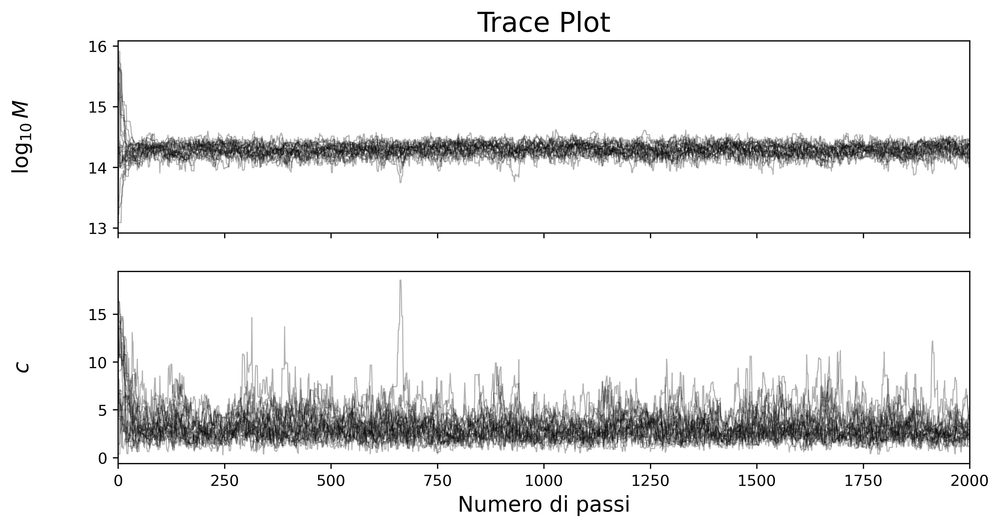

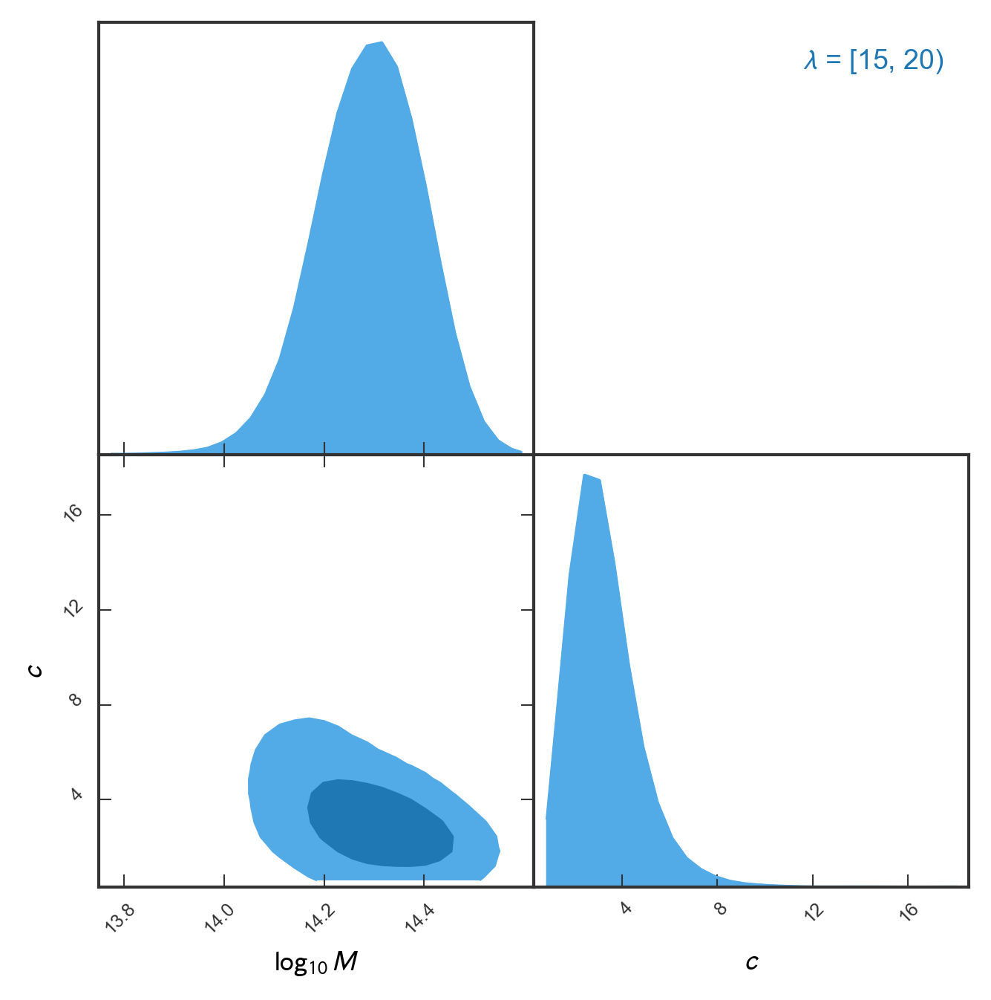

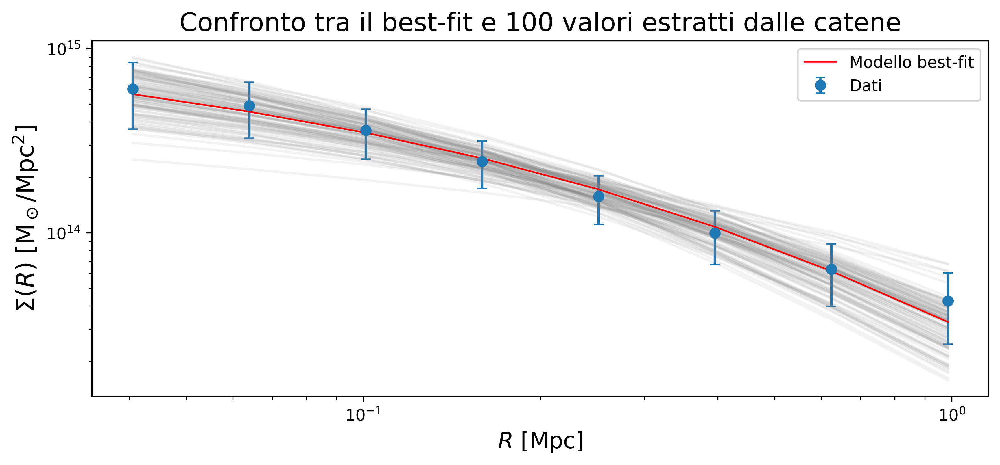

Intervallo di ricchezza = [20, 30)


100%|██████████████████████████████████████| 2000/2000 [00:06<00:00, 320.44it/s]


Tempo di autocorrelazione: [27.75945606 29.97594488]
Parametri medi: logM = 14.37, c = 3.28
Chi-quadro best-fit: 0.46
Parametri best-fit: logM = 14.41, c = 2.79
Incertezze LogM_ best: errore superiore = 0.06, errore inferiore = 0.13
Incertezze c_ best: errore superiore = 1.66, errore inferiore = 0.72


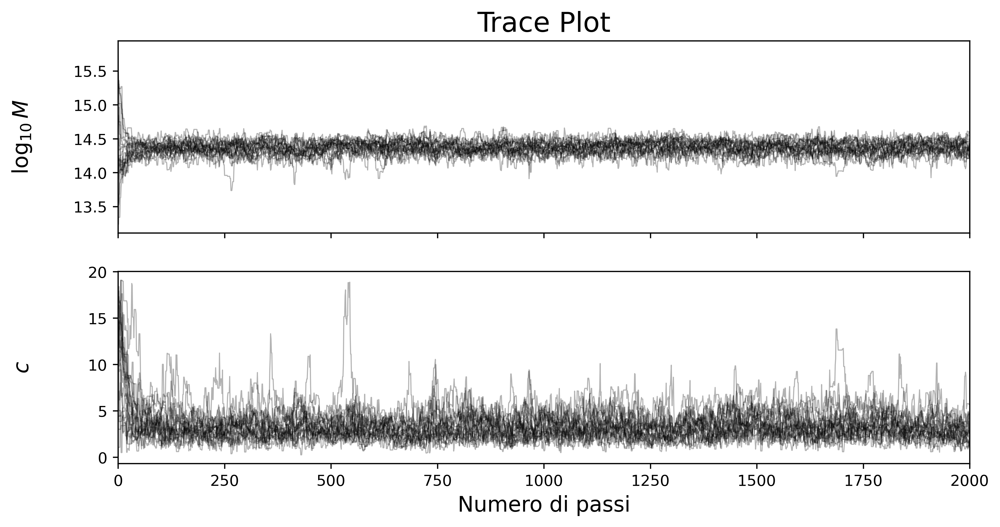

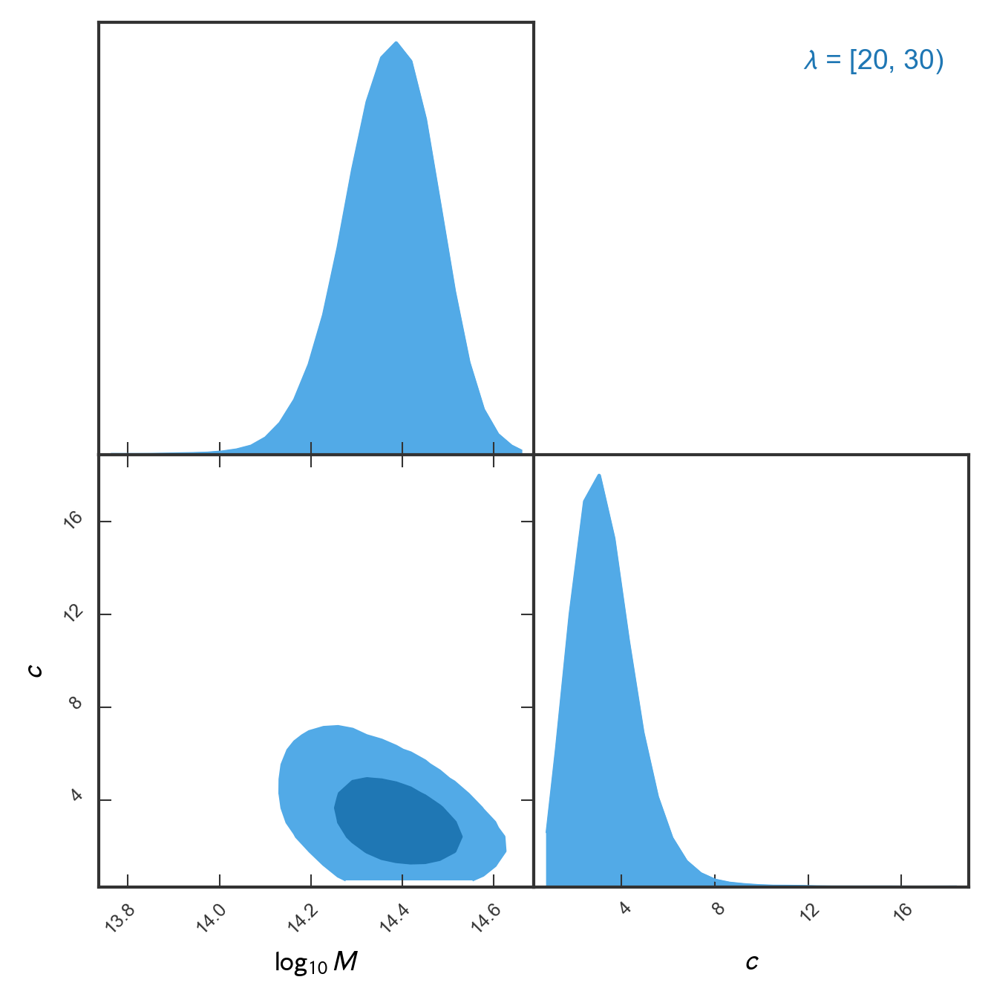

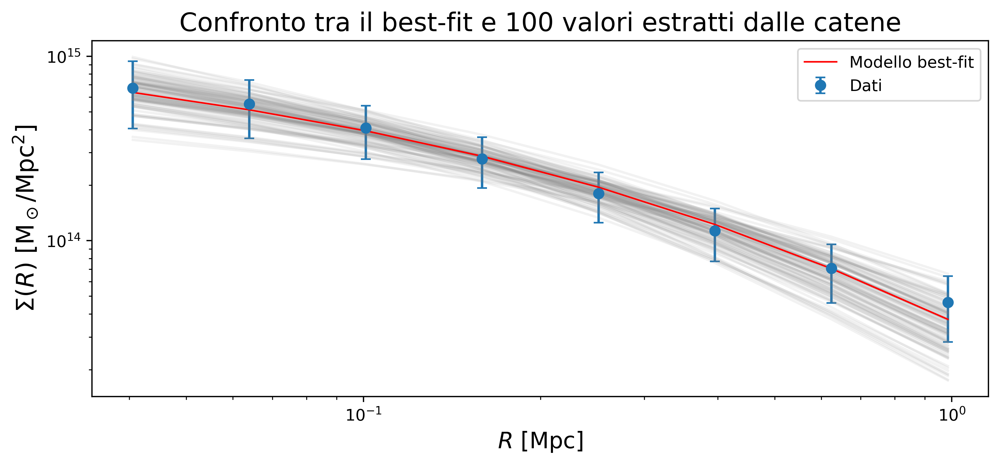

Intervallo di ricchezza = [30, 45)


100%|██████████████████████████████████████| 2000/2000 [00:09<00:00, 203.10it/s]


Tempo di autocorrelazione: [27.90409565 35.44907601]
Parametri medi: logM = 14.53, c = 3.52
Chi-quadro best-fit: 0.27
Parametri best-fit: logM = 14.57, c = 3.08
Incertezze LogM_ best: errore superiore = 0.06, errore inferiore = 0.13
Incertezze c_ best: errore superiore = 1.64, errore inferiore = 0.76


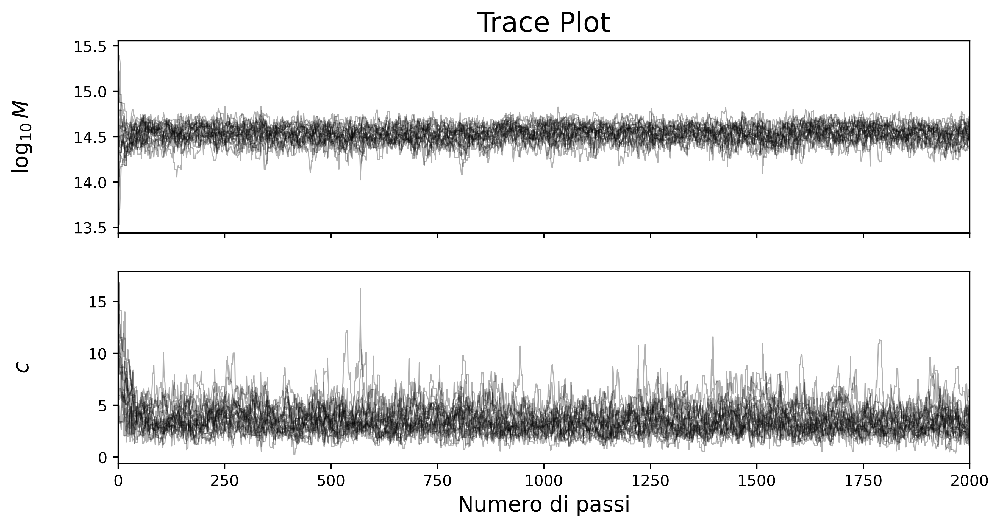

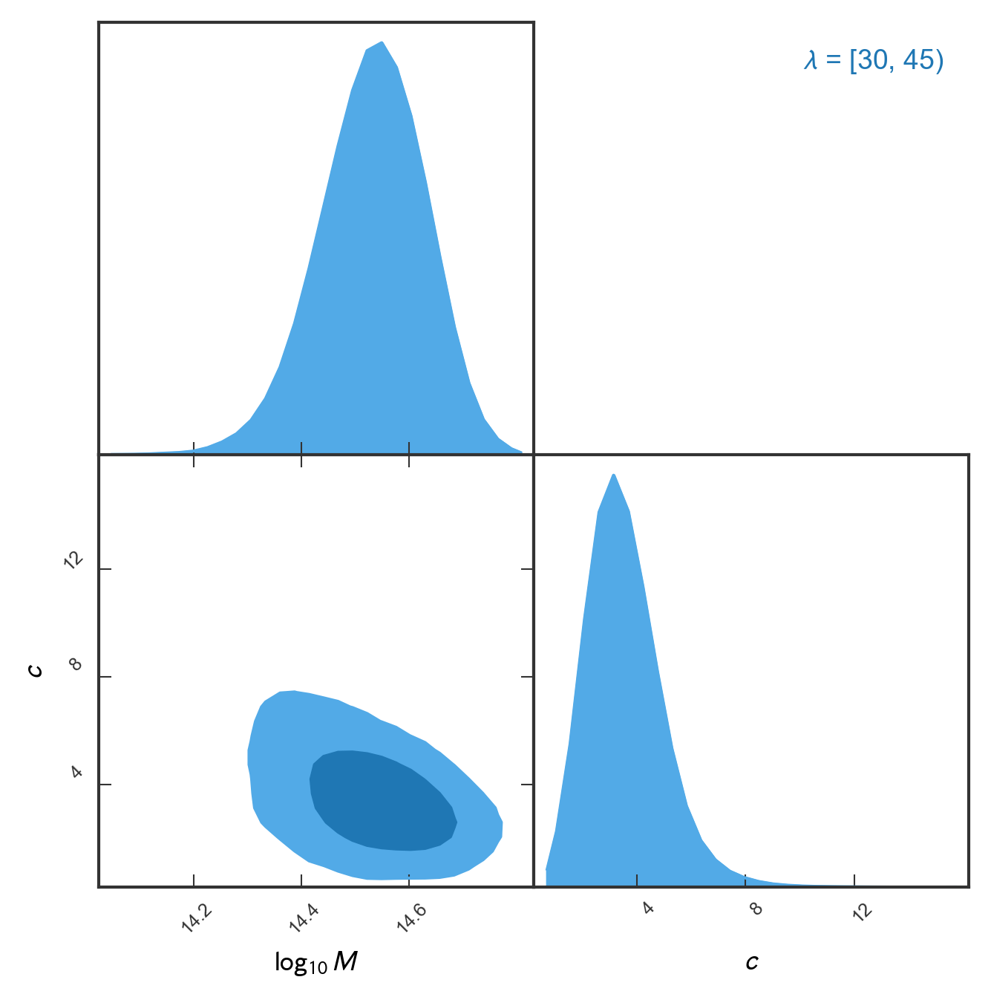

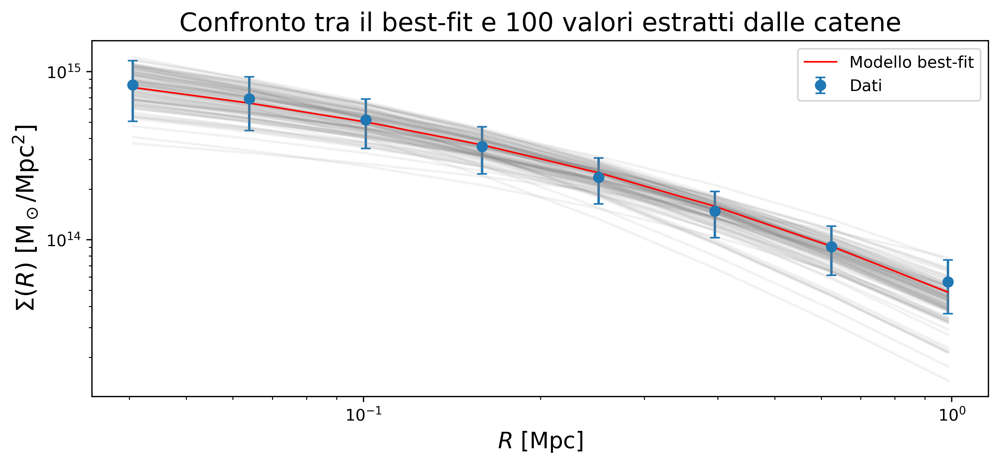

Intervallo di ricchezza = [45, 60)


100%|██████████████████████████████████████| 2000/2000 [00:06<00:00, 332.46it/s]


Tempo di autocorrelazione: [30.22496197 31.58079446]
Parametri medi: logM = 14.70, c = 3.64
Chi-quadro best-fit: 0.18
Parametri best-fit: logM = 14.72, c = 3.31
Incertezze LogM_ best: errore superiore = 0.06, errore inferiore = 0.11
Incertezze c_ best: errore superiore = 1.46, errore inferiore = 0.84


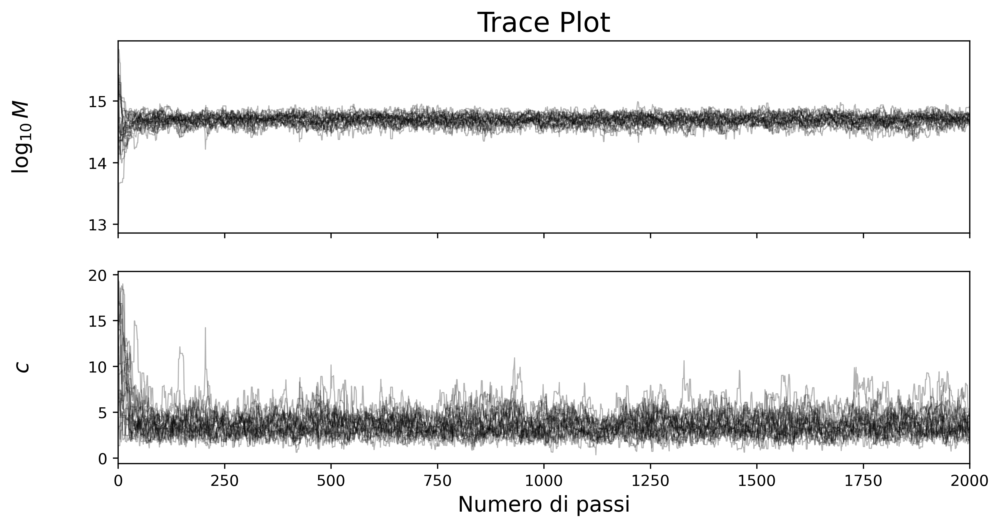

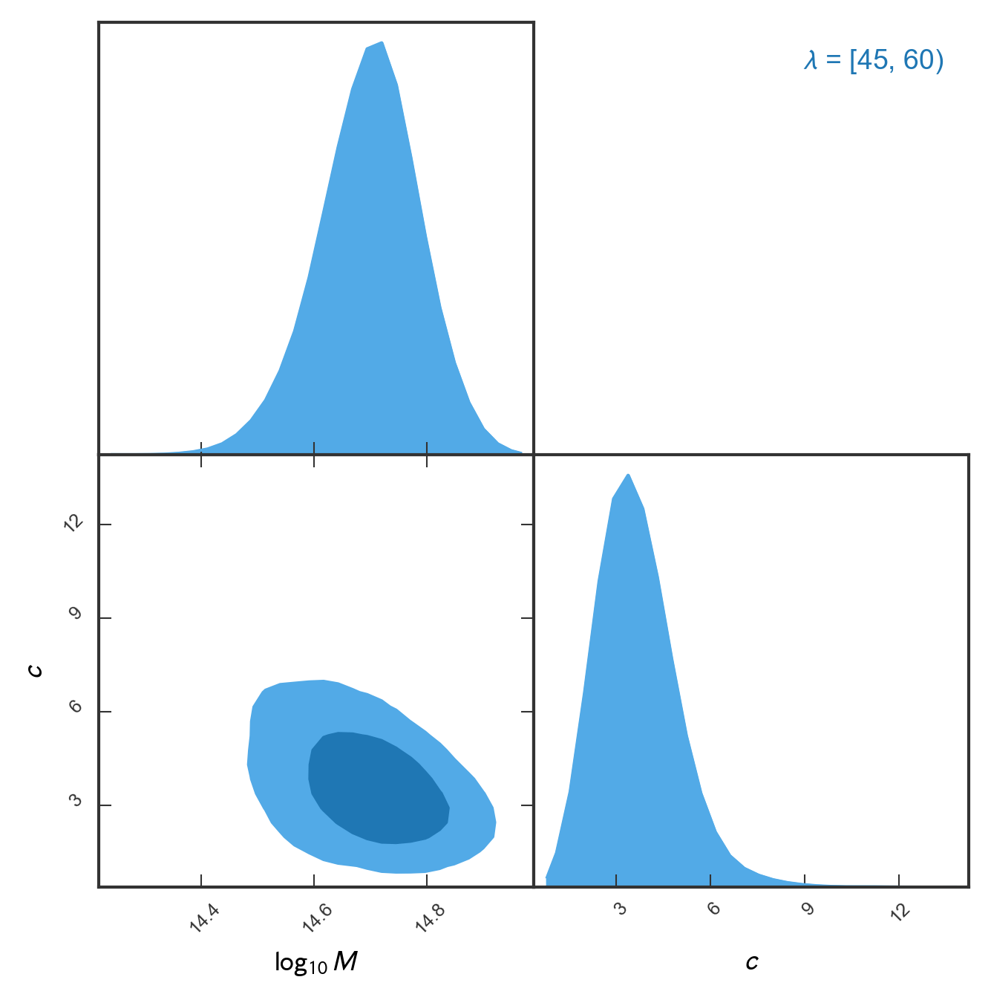

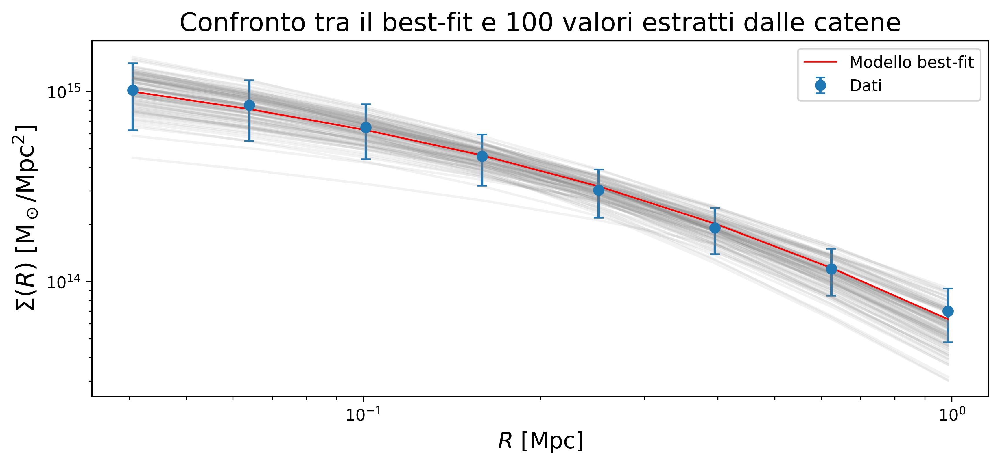

Intervallo di ricchezza = [60, 200)


100%|██████████████████████████████████████| 2000/2000 [00:06<00:00, 285.87it/s]


Tempo di autocorrelazione: [29.83200825 28.54392667]
Parametri medi: logM = 14.88, c = 4.00
Chi-quadro best-fit: 0.07
Parametri best-fit: logM = 14.92, c = 3.57
Incertezze LogM_ best: errore superiore = 0.06, errore inferiore = 0.15
Incertezze c_ best: errore superiore = 1.74, errore inferiore = 0.91


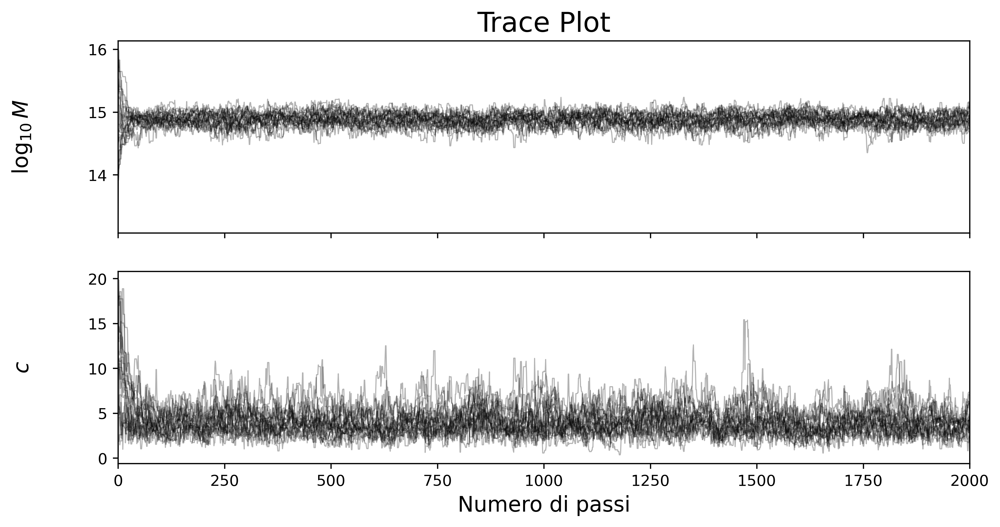

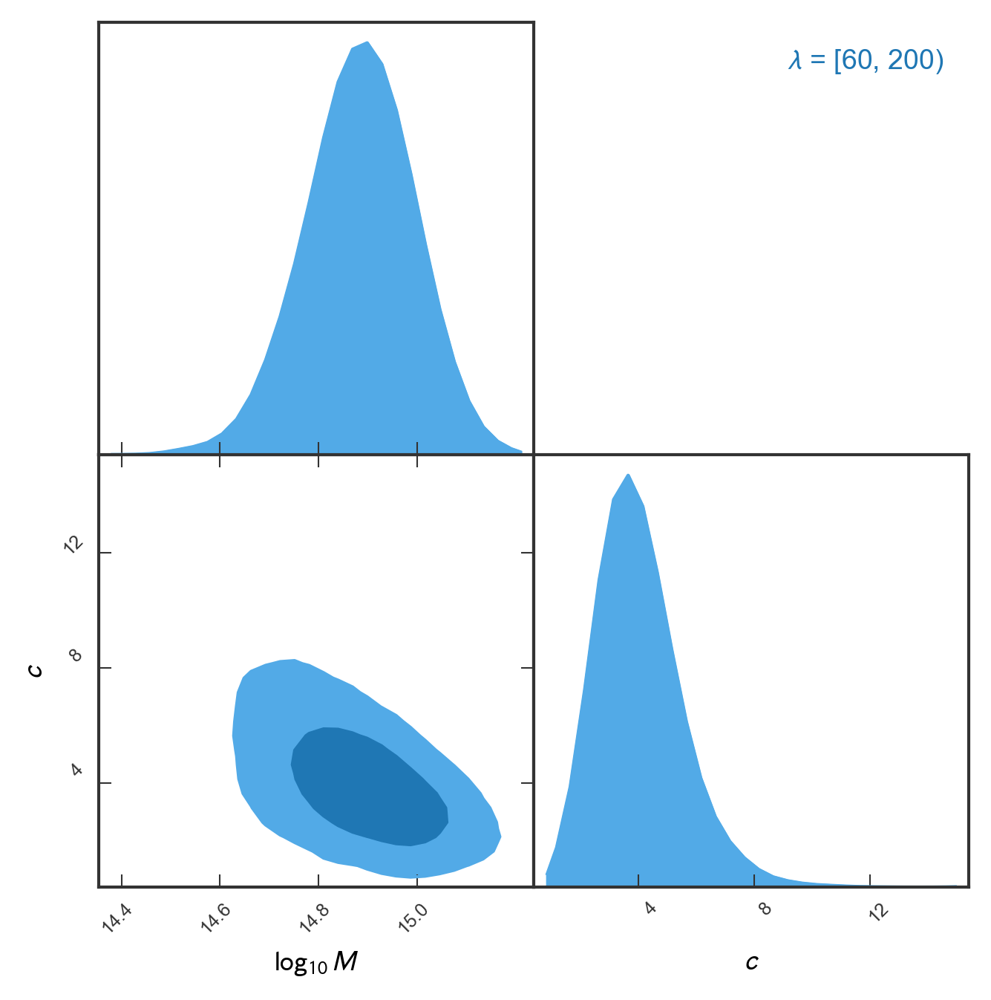

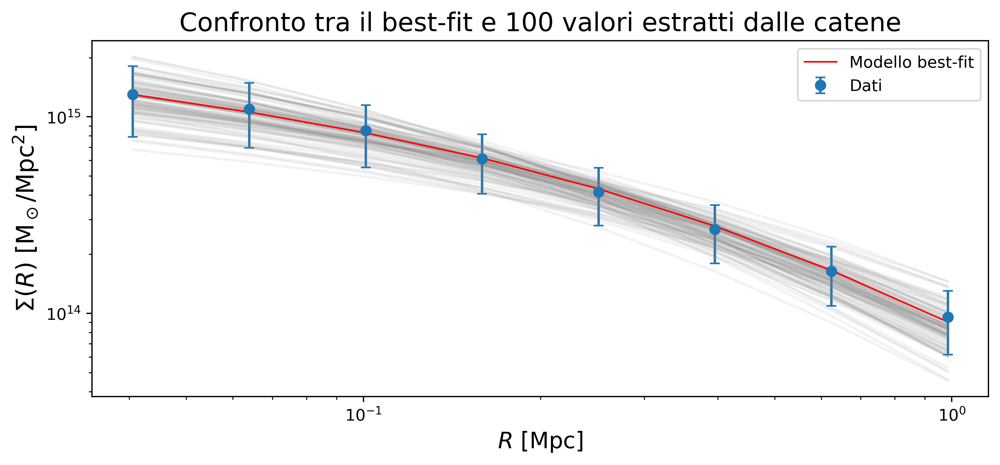

In [26]:
# Lista per memorizzare i risultati
results = []

for i in range(5):
    # Seleziona gli aloni nel bin di ricchezza corrente
    mask = (Lambda_TR >= lambda_bins[i]) & (Lambda_TR < lambda_bins[i+1])
    print(f'Intervallo di ricchezza = [{lambda_bins[i]}, {lambda_bins[i+1]})')
    
    mean_redshift = np.mean(Z[mask])
    mean_density_profile = np.mean(Sigma_of_R[mask], axis=0)

    Sigma_cov = Sigma_covar[i] 
    
    # Inizializza i walkers
    nwalkers = 20
    ndim = 2
    p0 = np.random.uniform(low=[13, 0.2], high=[16, 20], size=(nwalkers, ndim))
    
    # Campionamento
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=(mean_density_profile, R_values, mean_redshift, Sigma_cov))
    sampler.run_mcmc(p0, 2000, progress=True)  # 2000 passi ~ 67 * tau
    
    # Trace-Plot dei walkers
    fig, axes = plt.subplots(ndim, figsize=(10, 5), sharex=True, dpi=400)
    samples = sampler.get_chain()
    labels = ['$\log_{10} M$', '$c$']
    
    for j in range(ndim):
        ax = axes[j]
        ax.plot(samples[:, :, j], 'k', alpha=0.3, linewidth=0.7)  # k=nero
        ax.set_xlim(0, len(samples))
        ax.set_ylabel(labels[j], fontsize=14)
        ax.yaxis.set_label_coords(-0.1, 0.5)

        if j == 0:
            ax.set_title("Trace Plot", fontsize=18)
     
    axes[-1].set_xlabel('Numero di passi', fontsize=14)

    # Tempo di autocorrelazione della catena MCMC
    tau = sampler.get_autocorr_time()
    print('Tempo di autocorrelazione:', tau)
    burn_in = 3 * int(np.max(tau))
    
    # Estrae i campioni dalla catena MCMC
    samples_gtc = sampler.get_chain(discard=burn_in, flat=True)  # flat=True appiattisce le catene in un unico array
    
    # Grafico triangolare
    GTC = pygtc.plotGTC(chains=samples_gtc, paramNames=['$\log_{10}M$', '$c$'], chainLabels=[f'$\lambda$ = [{lambda_bins[i]}, {lambda_bins[i+1]})'], figureSize='MNRAS_page')
    plt.gcf().set_dpi(300)

    # Medie
    logM_mean = np.mean(samples_gtc[:, 0])
    c_mean = np.mean(samples_gtc[:, 1])
    
    # Calcola i valori di best-fit (massimo della distribuzione a posteriori)
    best_fit_index = np.argmax(sampler.get_log_prob(discard=burn_in,flat=True))
    best_fit_params = samples_gtc[best_fit_index]
    logM_best, c_best = best_fit_params

    # Calcola il chi-quadro per i parametri di best-fit
    Sigma_model_best = np.array([NFW_profile(R, 10**logM_best, c_best, mean_redshift) for R in R_values])
    diff_best = mean_density_profile - Sigma_model_best
    chi2_best = np.dot(diff_best, np.dot(np.linalg.inv(Sigma_cov), diff_best))

    # Calcolo i percentili
    lw = np.percentile(samples_gtc, 16, axis=0)
    up = np.percentile(samples_gtc, 84, axis=0)

    # Calcolo errore
    logM_errsup = up[0] - logM_best
    c_errsup = up[1] - c_best
    logM_errinf = logM_best - lw[0]
    c_errinf = c_best - lw[1]

    # Stampa i risultati
    print(f'Parametri medi: logM = {logM_mean:.2f}, c = {c_mean:.2f}')
    print(f'Chi-quadro best-fit: {chi2_best:.2f}')
    print(f'Parametri best-fit: logM = {logM_best:.2f}, c = {c_best:.2f}')
    print(f'Incertezze LogM_ best: errore superiore = {logM_errsup:.2f}, errore inferiore = {logM_errinf:.2f}')
    print(f'Incertezze c_ best: errore superiore = {c_errsup:.2f}, errore inferiore = {c_errinf:.2f}')
    
    # Aggiunge i risultati alla lista
    results.append({
    '$Bin \ \lambda$': f'[{lambda_bins[i]}, {lambda_bins[i+1]})',
    '$\log M_{mean}$': f'{logM_mean:.3f}',
    '$c_{mean}$': f'{c_mean:.3f}',
    '$\log M_{best}$': f'{logM_best:.3f}',
    '$\log M_{err+}$': f'{logM_errsup:.3f}',
    '$\log M_{err-}$': f'{logM_errinf:.3f}',
    '$c_{best}$': f'{c_best:.3f}',
    '$c_{err+}$': f'{c_errsup:.3f}',
    '$c_{err-}$': f'{c_errinf:.3f}',
    '$\chi^2_{best}$': f'{chi2_best:.3f}'
    })
    
    # Confronta i dati con 100 coppie di valori di M e c estratti dalle catene  
    n_samples = 100
    random_indices = np.random.choice(np.arange(len(samples_gtc)), n_samples, replace=False)  # escludo i primi step (burn in)
    random_samples = samples_gtc[random_indices]    # righe corrispondenti ai random_indices

    # Crea grafico log-log
    plt.figure(figsize=(10, 4), dpi=400)
    plt.errorbar(R_values, mean_density_profile, yerr=np.sqrt(np.diag(Sigma_cov)), capsize=3, fmt='o', label='Dati')
    plt.xscale('log'); plt.yscale('log')
    
    for params in random_samples:
        logM, c = params
        Sigma_model = np.array([NFW_profile(R, 10**logM, c, mean_redshift) for R in R_values])
        plt.plot(R_values, Sigma_model, color='gray', alpha=0.1)
        plt.xscale('log'); plt.yscale('log')

    plt.plot(R_values, Sigma_model_best, color='red', label='Modello best-fit', linewidth=1)

    plt.xscale('log'); plt.yscale('log')
    plt.xlabel('$R$ [Mpc]', fontsize=14)
    plt.ylabel('$\Sigma(R)$ [M$_\odot$/Mpc$^2$]', fontsize=15)
    plt.legend()
    plt.title("Confronto tra il best-fit e 100 valori estratti dalle catene", fontsize=16)
    plt.show()

### Risultati:

In [28]:
import pandas as pd

In [29]:
# Crea un DataFrame con i risultati
results_df = pd.DataFrame(results)
results_df.index = [""] * len(results_df)  # rimuove la prima colonna di indici
styled_results_df = results_df.style.set_table_styles([
    {'selector': 'td:nth-child(2), th:nth-child(2)', 'props': [('border-right', '1px solid #DDDDDD')]},  # linea verticale grigia
    {'selector': 'thead th', 'props': [('border-bottom', '1px solid #DDDDDD')]}  # linea orizzontale grigia
])

# Stampa la tabella
styled_results_df

,$Bin \ \lambda$,$\log M_{mean}$,$c_{mean}$,$\log M_{best}$,$\log M_{err+}$,$\log M_{err-}$,$c_{best}$,$c_{err+}$,$c_{err-}$,$\chi^2_{best}$
,"[15, 20)",14.291,3.175,14.331,0.062,0.140,2.677,1.703,0.725,0.571
,"[20, 30)",14.371,3.277,14.409,0.056,0.132,2.791,1.664,0.723,0.457
,"[30, 45)",14.531,3.524,14.568,0.058,0.129,3.076,1.641,0.762,0.272
,"[45, 60)",14.696,3.637,14.721,0.059,0.108,3.313,1.458,0.836,0.182
,"[60, 200)",14.883,4.004,14.924,0.064,0.147,3.569,1.742,0.912,0.068


### Commenti:
#### Interpretazione del $\chi^2$:
L'analisi del $\chi^2$ ci permette di capire quanto bene il modello si adatta ai dati. Per valutare la bontà del fit, confrontiamo il 
$\chi^2$ con il numero di gradi di libertà ($\nu$):  $$\nu=N-k$$
dove:
* $N$: Numero di punti dati.
* $k$: Numero di parametri del modello.

Un $\chi^2$ vicino a $\nu$ indica un buon fit. Nel nostro caso $N=8$ e $k=2 \ \Rightarrow \ \nu=6 \gg \chi^2_{best}$. Possiamo quindi affermare che il fit analitico $\Sigma(R,M,c,z)$ descrive fedelmente il profilo di densità proiettato degli aloni di materia oscura.
#### Tempo di autocorrelazione $(\tau)$:
Il _tempo di autocorrelazione_ (_autocorrelation time_) è una misura di quanto tempo impiega una catena _MCMC_ per esplorare efficacemente lo spazio dei parametri, in particolare indica quanti passi servono per avere un campione indipendente. Se è basso, la catena esplora più rapidamente lo spazio dei parametri, mentre se è alto, i campioni sono più dipendenti dai passi precedenti, e ci vorrà più tempo per ottenere una stima affidabile della distribuzione.
Avendo $2000$ passi nella catena e un $\tau \approx 30$ per entrambi i parametri, il numero di campioni indipendenti sarà circa: $N_{eff}=\frac{2000}{30} \approx 67$. Questo significa che in realtà vi sono solo $\approx 67$ campioni indipendenti utili per stimare la distribuzione.  
Essendo questo $\tau$ relativamente basso possiamo affermare che il campionamento sta funzionando efficentemente.
#### Confronto con valori estratti dalle catene:
L'anailisi del grafico rinforza le considerazioni precedenti, infatti:
* Il best fit approssima in maniera accurata di dati.
* I fit con i valori estratti dalle catene si distribuiscono attrono ai dati in modo consistente con il valore degli errori.
* I valori vengono estratti dopo un burn-in di $3 \cdot \tau \approx 90$ passi, questo è un valore relativamente piccolo a riprova dell'efficienza del campionamento.
